In [1]:
cd((@__DIR__) * raw"\..")
include("../table_reader.jl")
include("../utils/Missing_values.jl")

ImputeMissingValues!

In [2]:
series=extract_series("TX_STAID000737.txt",plot=false)
series=truncate_MV(series,"TX")
years=unique(Dates.year.(series.DATE))

include("../utils/Simulation.jl")
Days_list=GatherYearScenario(series[!,2],series.DATE)
avg_day=mean.(Days_list)
max_day=maximum.(Days_list)
df_month = @chain series begin
    @transform(:TEMP = series[!,2]) #Give a common name for TX, TN, etc...
    @transform(:MONTH = month.(:DATE)) #add month column
    @by(:MONTH, :MONTHLY_MEAN = mean(:TEMP), :MONTHLY_STD = std(:TEMP), :MONTHLY_MAX = maximum(:TEMP)) # grouby MONTH + takes the mean/std in each category 
end

#Imputing missing values
# include("utils/Missing_values.jl")
# ImputeMissingValues!(series[!,2],series.DATE)
# N=length(series[!,2])

Row,MONTH,MONTHLY_MEAN,MONTHLY_STD,MONTHLY_MAX
,Int64,Float64,Float64,Float64
1,1,5.72561,4.27158,15.2
2,2,6.92369,4.30074,19.0
3,3,10.4113,4.13513,24.8
4,4,13.9756,4.33257,27.9
5,5,17.7996,4.37329,31.7
6,6,20.7504,4.25252,34.8
7,7,22.8692,4.1839,41.5
8,8,22.9127,3.89454,37.1
9,9,19.88,3.64365,35.1


## I. Series filtered by removing a trigonometric periodicity

In [3]:
X = ones(length(series.DATE))
beta = inv(transpose(X) * X) * transpose(X) * series[!, 2]

include("../utils/periodicity.jl")
trigo_function, param = fitted_periodicity_fonc(series[!, 2] .- beta, series.DATE, OrderTrig=5, return_parameters=true)
periodicity = trigo_function.(series.DATE)
x = series[!, 2] - periodicity
period = trigo_function.(Date(0):Date(1)-Day(1))
println(param)
println(beta)

[0.029651367583126396, -8.31597579080282, -2.8560628638999, -0.5729703534288062, 0.5951424458221926, 0.15249245990506252, -0.007316998257738195, 0.08149579031104236, 0.11765158011578836, 0.20064219309440134, 0.014581925726676874]
14.400191061071306


In [4]:
trigo_function, param = fitted_periodicity_fonc(series[!, 2], series.DATE, OrderTrig=5, return_parameters=true)
periodicity = trigo_function.(series.DATE)
x = series[!, 2] - periodicity
period = trigo_function.(Date(0):Date(1)-Day(1))
println(param)

[14.429842428654432, -8.315975790802822, -2.856062863899897, -0.5729703534288063, 0.5951424458221918, 0.1524924599050625, -0.007316998257737931, 0.08149579031104243, 0.11765158011578832, 0.20064219309440098, 0.014581925726676988]


## Segmenting the dataset by month

In [5]:
include("../utils/Separation.jl")
Monthly_date=MonthlySeparateDates(series.DATE)
Monthly_temp=MonthlySeparateX(x,series.DATE)

12-element Vector{Vector{AbstractVector}}:
 [[-3.5562655944994597, -3.2378182089740477, -1.3201470766475651, -2.6032274067176076, -2.887047152306769, -3.371606957983623, -2.6569200154760475, -4.44301182910718, -5.829919893112371, -5.917693283605852  …  -5.569433679224138, -6.676999981257003, -7.88694124937895, -12.799387717949287, -7.614467211653112, -7.832304141114905, -6.653018526381116, -9.176725055072328, -3.903532181720011, -1.2335412744714898], [-6.556265594499459, -7.537818208974048, -6.820147076647565, -7.1032274067176076, -5.9870471523067685, -4.671606957983623, -4.956920015476047, -3.24301182910718, 1.4700801068876288, 4.782306716394148  …  -5.969433679224139, -5.876999981257002, -5.086941249378949, -4.599387717949288, -6.114467211653112, -4.832304141114905, -4.153018526381116, 1.4232749449276723, 4.096467818279989, 1.8664587255285099], [-3.7562655944994594, 0.062181791025952116, -5.020147076647564, -4.403227406717607, -4.287047152306769, -8.871606957983623, -7.65692001547604

## Autocorrelations

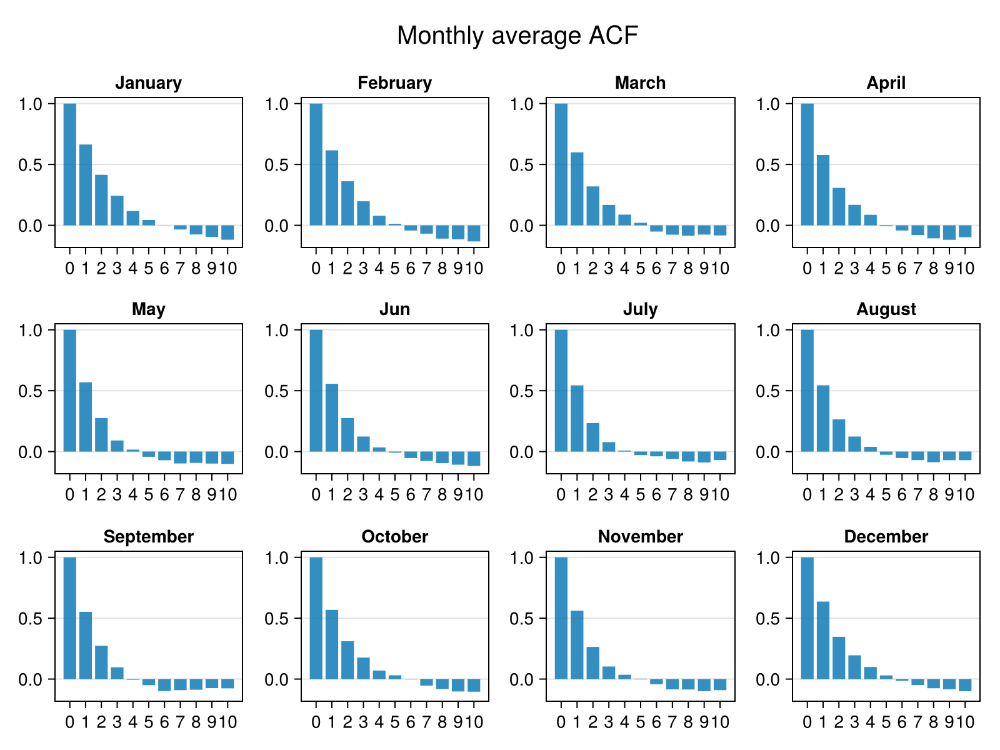

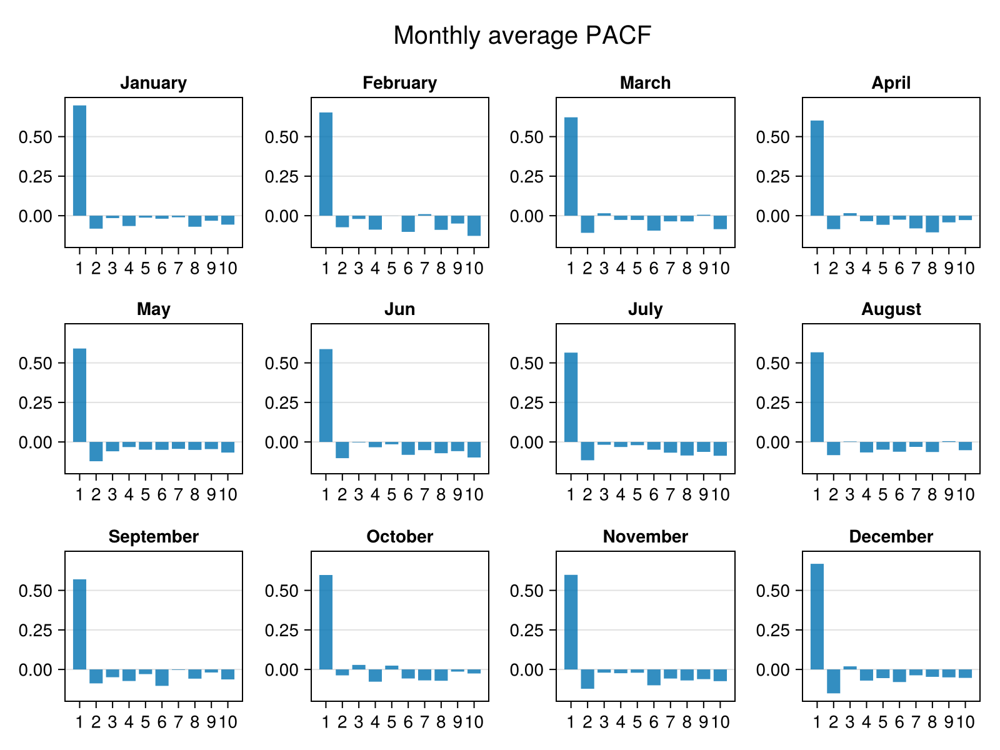

CairoMakie.Screen{IMAGE}


In [6]:
include("../utils/ACF_PACF.jl")
display(MonthlyACF(Monthly_temp))
display(MonthlyPACF(Monthly_temp))

For each month, it still looks like an AR(1) model

# Estimation AR(1)

## Estimation

ERROR: LoadError: too many parameters for type AbstractInterpolation
Stacktrace:
 [1] top-level scope
   @ C:\Users\goninarn\.julia\packages\SparseConnectivityTracer\litqn\ext\SparseConnectivityTracerDataInterpolationsExt.jl:28
 [2] include
   @ .\Base.jl:557 [inlined]
 [3] include_package_for_output(pkg::Base.PkgId, input::String, depot_path::Vector{String}, dl_load_path::Vector{String}, load_path::Vector{String}, concrete_deps::Vector{Pair{Base.PkgId, UInt128}}, source::String)
   @ Base .\loading.jl:2881
 [4] top-level scope
   @ stdin:6
in expression starting at C:\Users\goninarn\.julia\packages\SparseConnectivityTracer\litqn\ext\SparseConnectivityTracerDataInterpolationsExt.jl:3
in expression starting at stdin:6
┌ Error: Error during loading of extension SparseConnectivityTracerDataInterpolationsExt of SparseConnectivityTracer, use `Base.retry_load_extensions()` to retry.
│   exception = 1-element ExceptionStack:
Failed to precompile SparseConnectivityTracerDataInterpolationsExt [

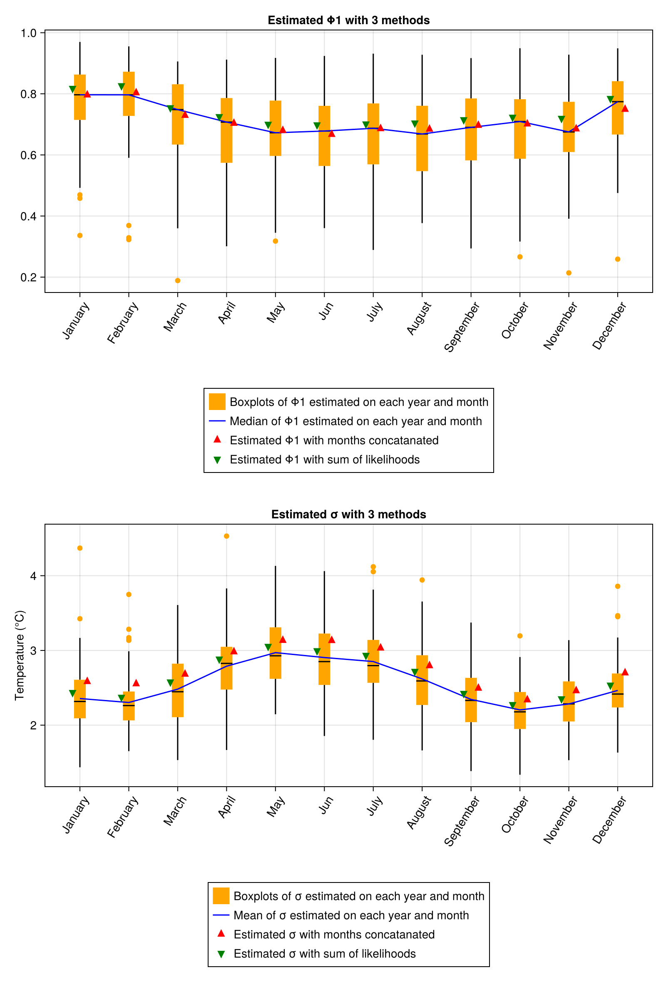

CairoMakie.Screen{IMAGE}


In [7]:
include(raw"..\utils\Estimation.jl")
Params, figure= AllEstimation(Monthly_temp, lineplot=true)
display(figure)

## Simulation

### With the mean of estimations on each month

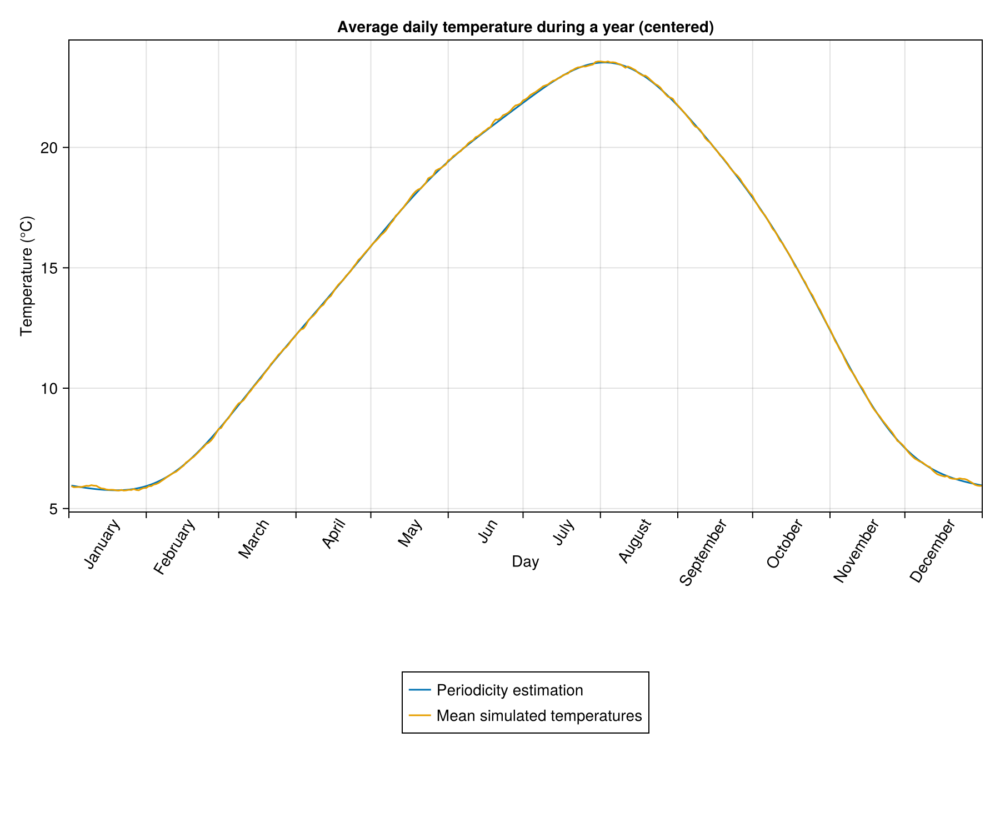

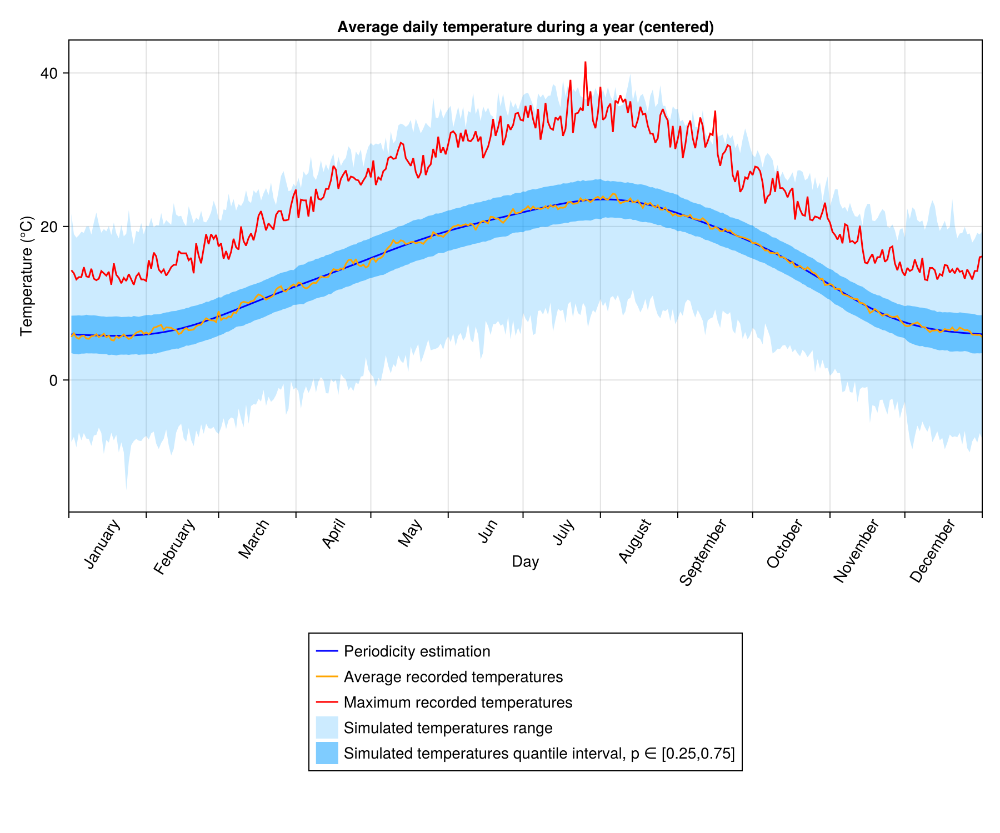

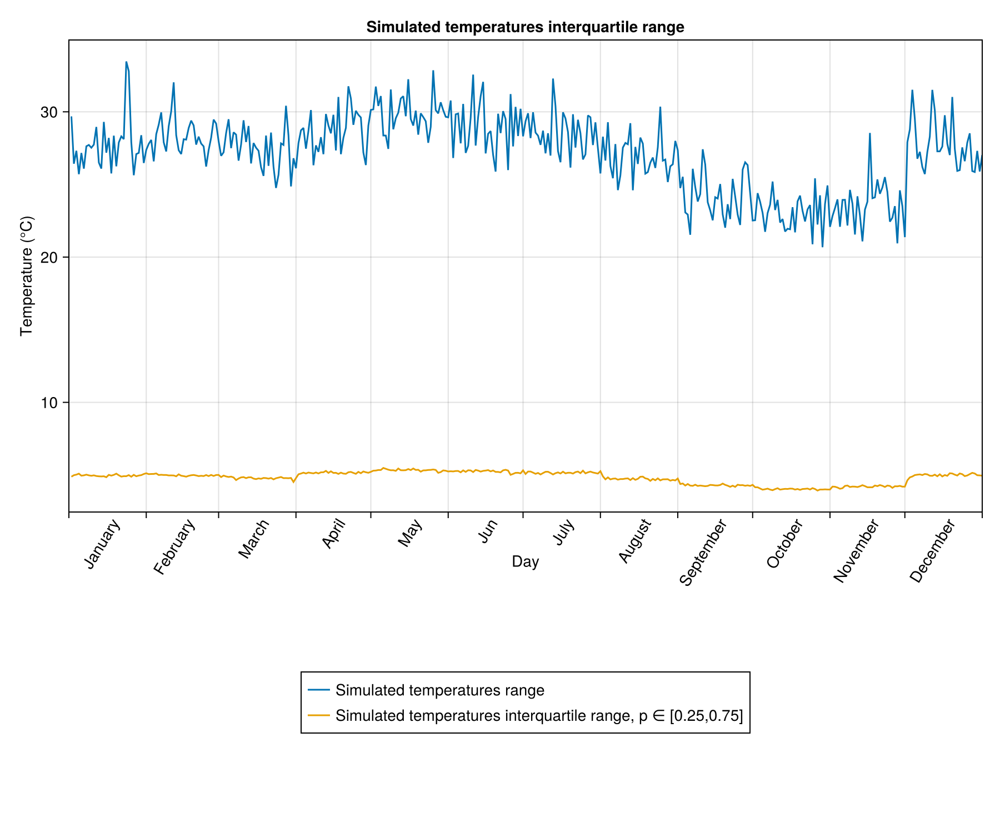

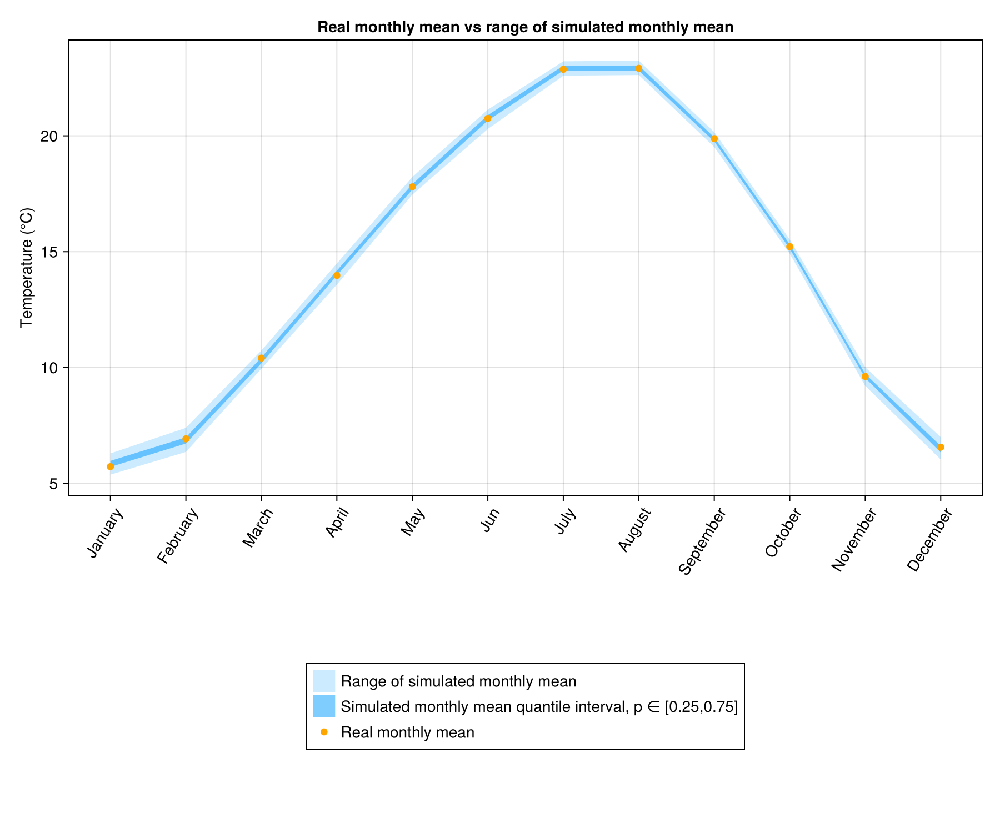

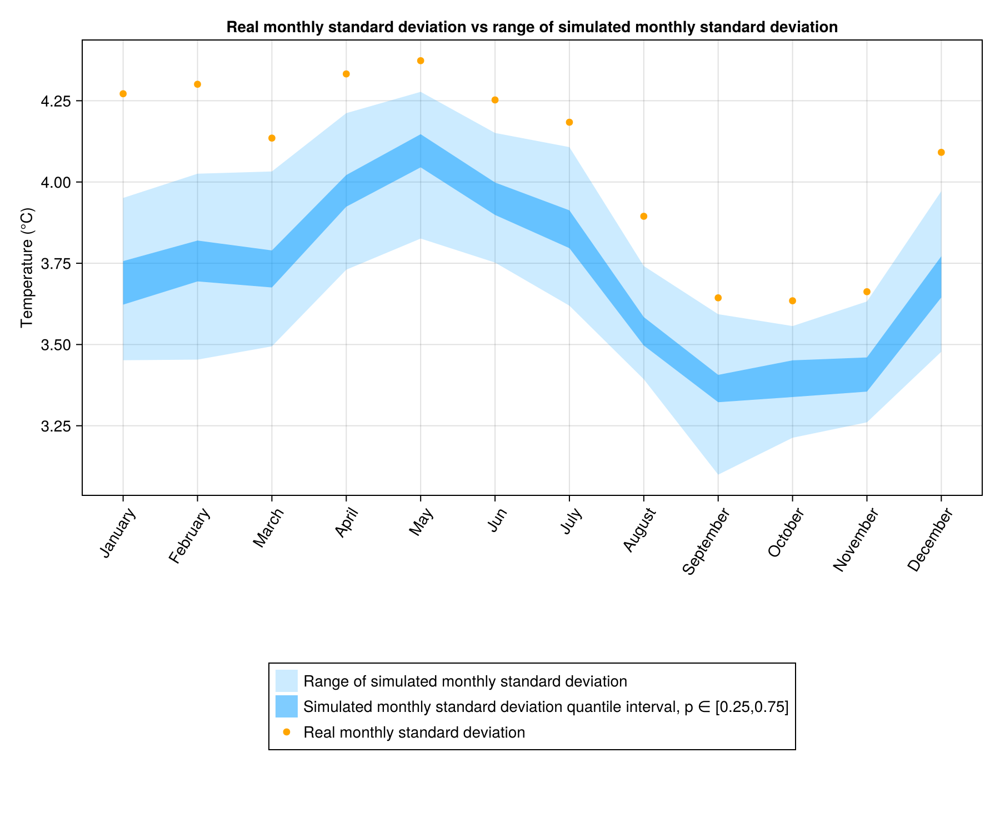

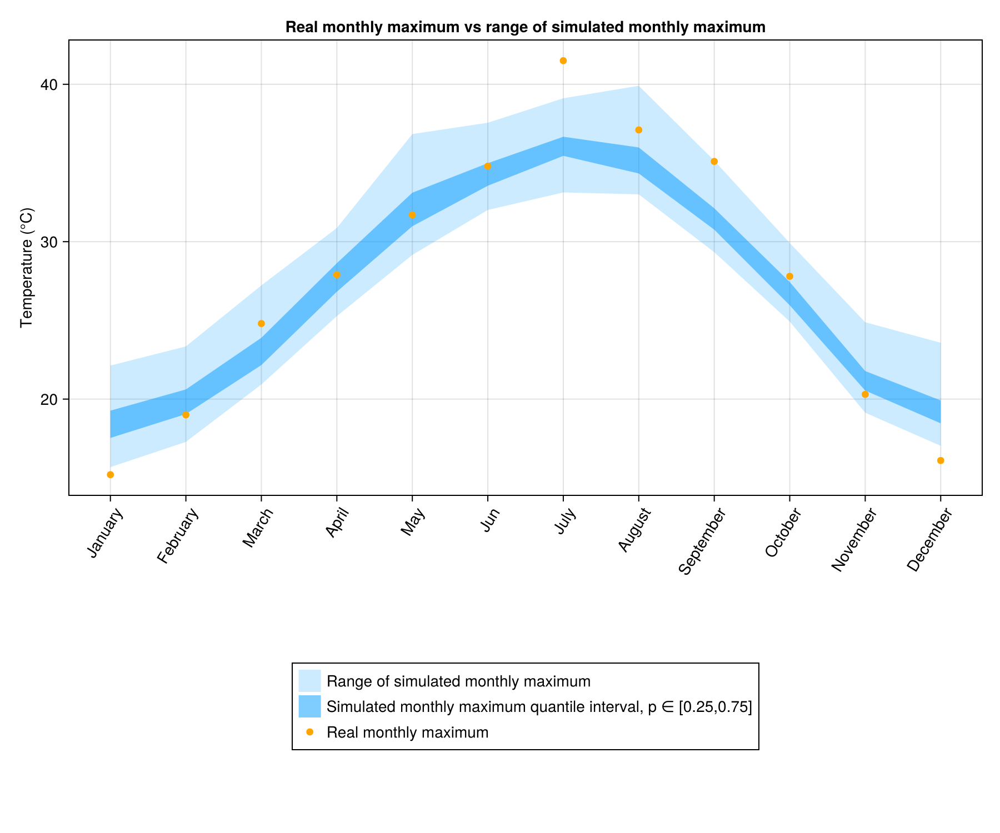

(CairoMakie.Screen{CairoMakie.IMAGE}(Scene (900px, 750px):
  0 Plots
  2 Child Scenes:
    ├ Scene (900px, 750px)
    └ Scene (900px, 750px), Cairo.CairoSurfaceImage{ColorTypes.ARGB32}(Ptr{Nothing} @0x000001e5a1683120, 1800.0, 1500.0, ColorTypes.ARGB32[ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); … ; ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8)]), Cairo.CairoContext(Ptr{Nothing} @0x000001

In [8]:
include("../utils/Simulation.jl")
include("../utils/Plotting.jl")
Φ_month_mean,σ_month_mean=TakeParameters(Params,"mean")
sample_ = SimulateScenarios(Monthly_temp[1][1][1],series.DATE[1]:series.DATE[end],Φ_month_mean,σ_month_mean,period,n=100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
display(PlotYearCurves([period,avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered)",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
"Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))

### With the median of the estimations on each month

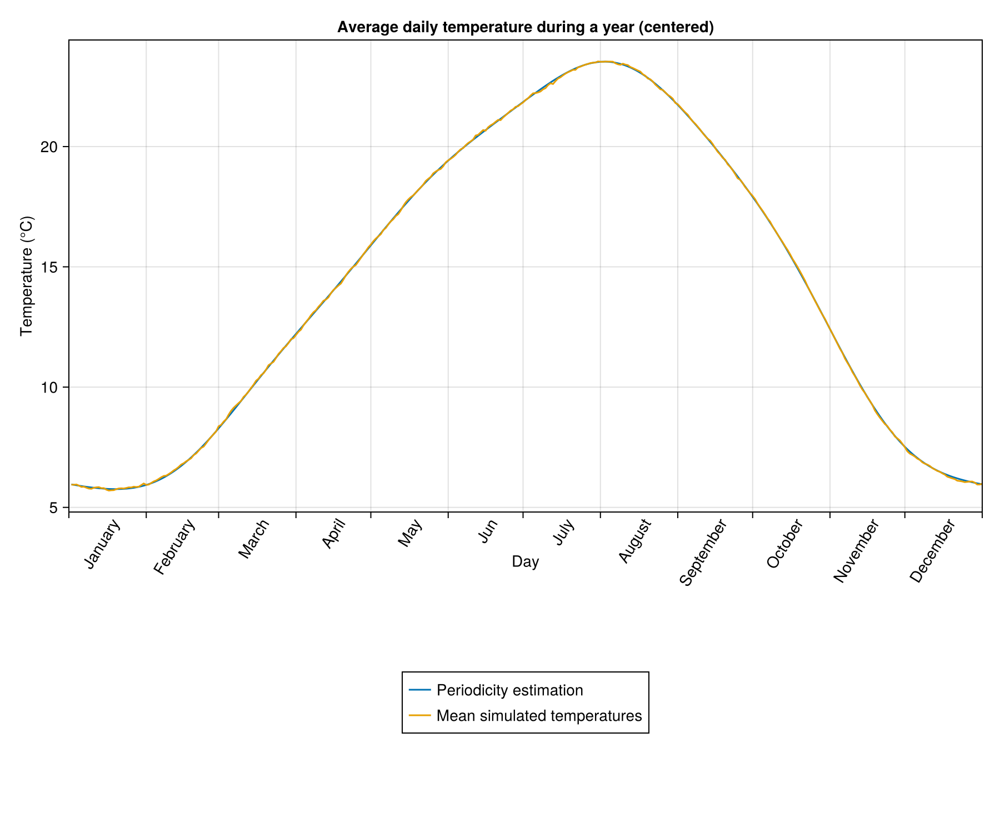

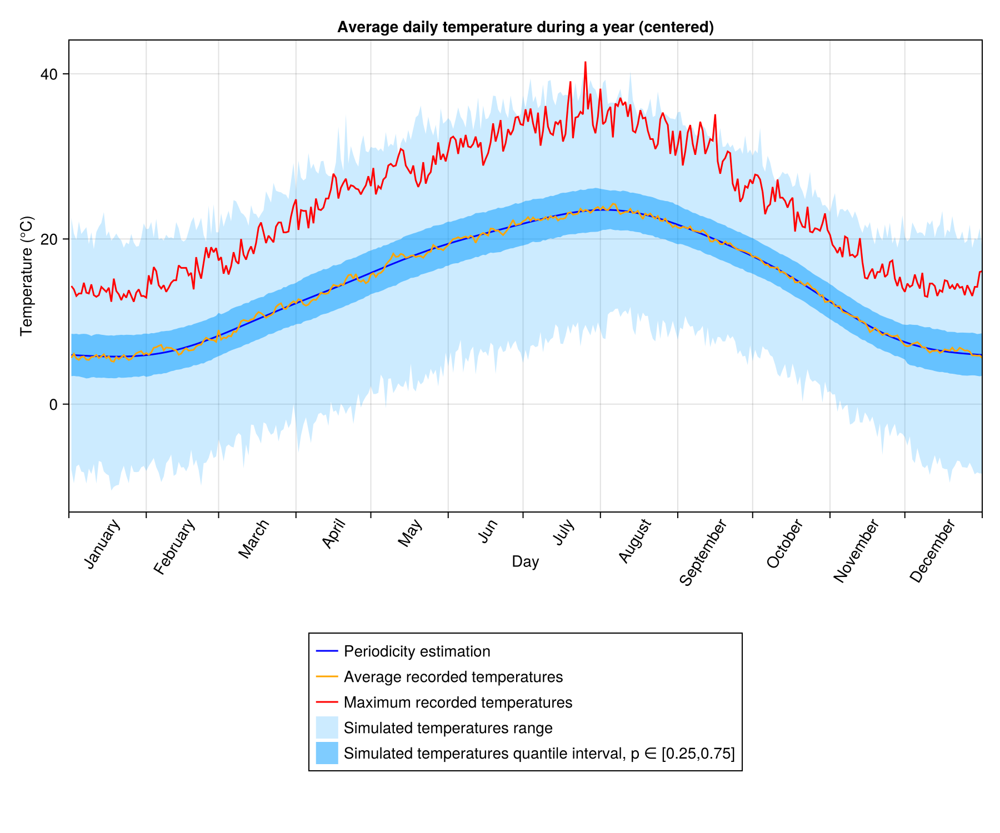

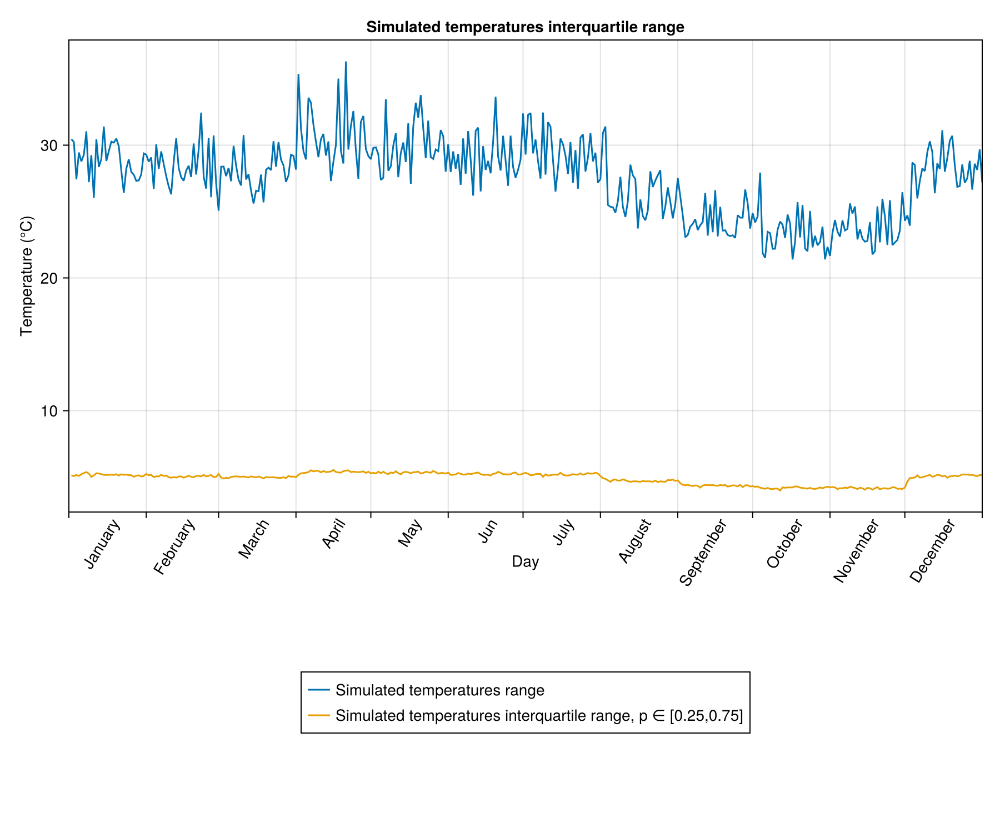

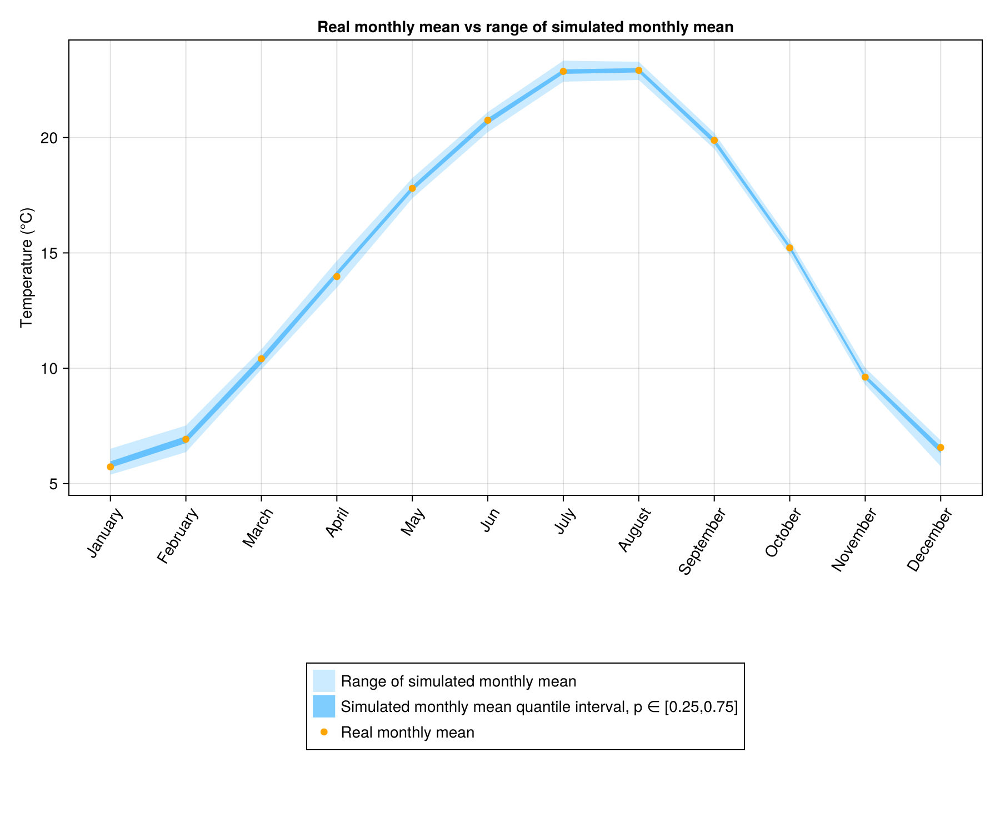

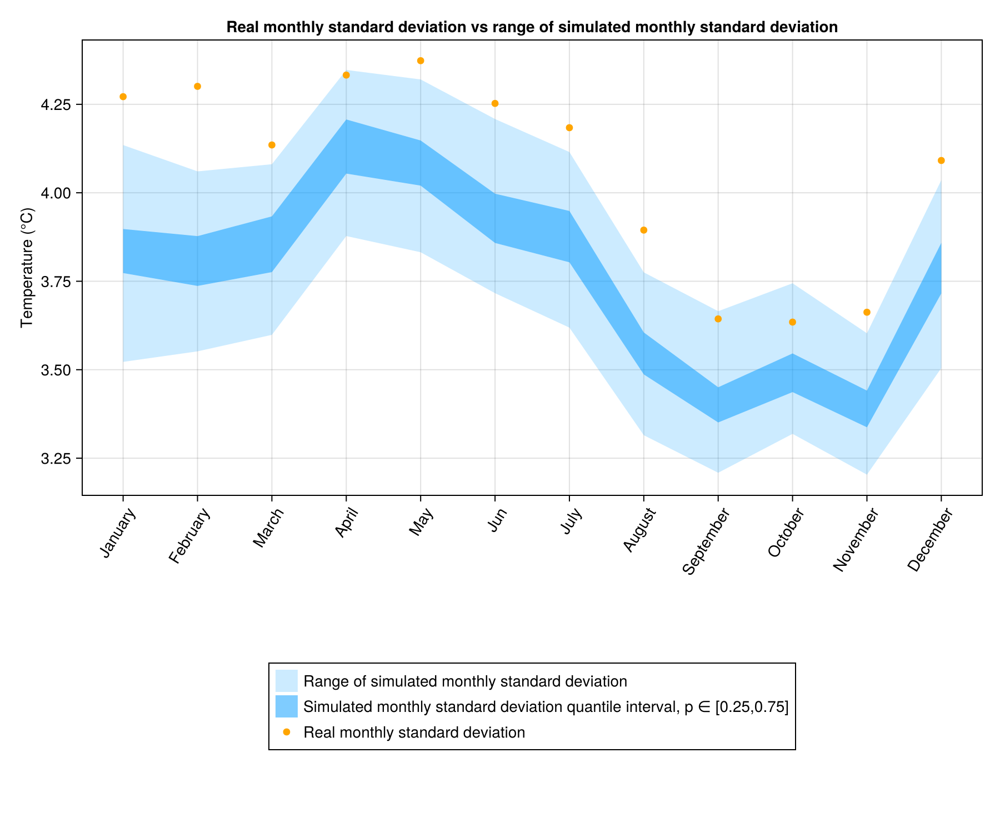

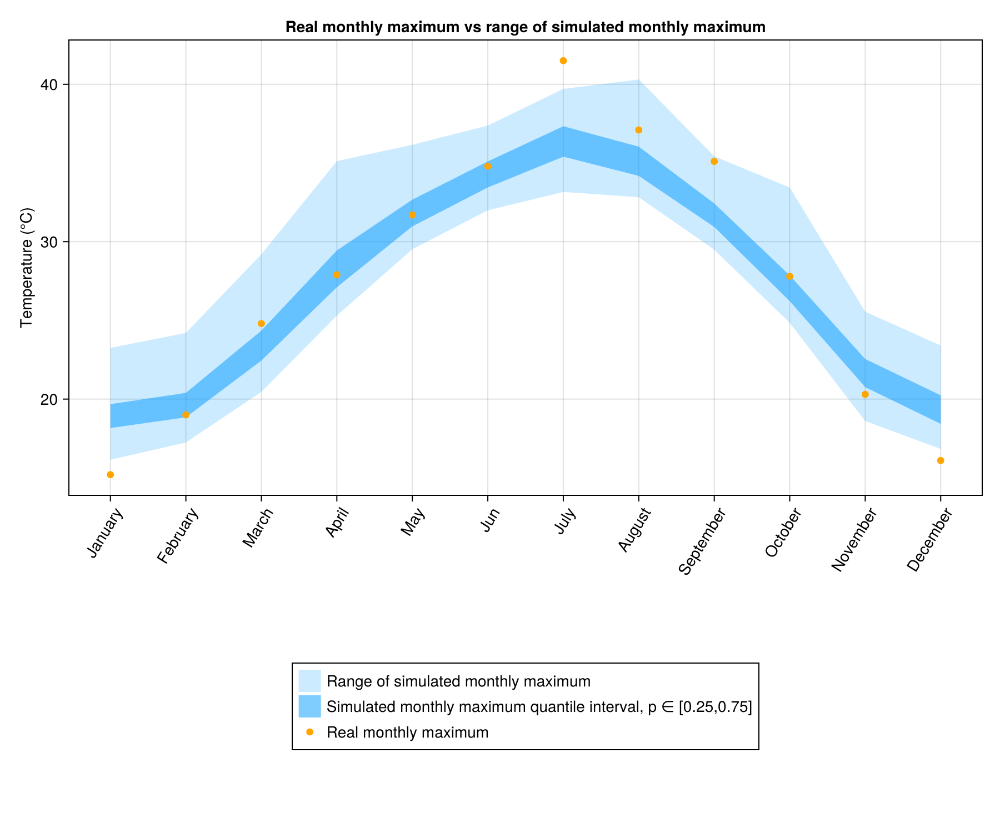

(CairoMakie.Screen{CairoMakie.IMAGE}(Scene (900px, 750px):
  0 Plots
  2 Child Scenes:
    ├ Scene (900px, 750px)
    └ Scene (900px, 750px), Cairo.CairoSurfaceImage{ColorTypes.ARGB32}(Ptr{Nothing} @0x000001e5beaa2c10, 1800.0, 1500.0, ColorTypes.ARGB32[ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); … ; ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8)]), Cairo.CairoContext(Ptr{Nothing} @0x000001

In [9]:
include("../utils/Simulation.jl")
include("../utils/Plotting.jl")
Φ_month_mean,σ_month_mean=TakeParameters(Params,"median")
sample_ = SimulateScenarios(Monthly_temp[1][1][1],series.DATE[1]:series.DATE[end],Φ_month_mean,σ_month_mean,period,n=100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
display(PlotYearCurves([period,avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered)",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
"Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))

We see clearly that interquartile range is shorter during summer and larger during winter.

### With months concatanation

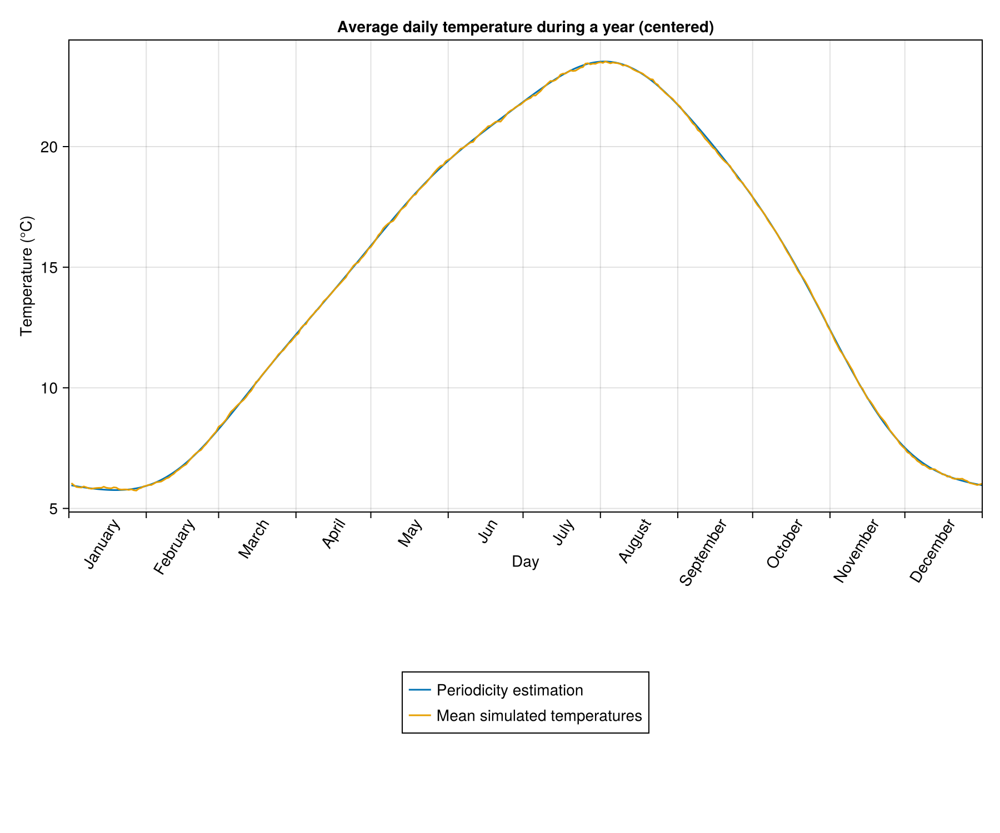

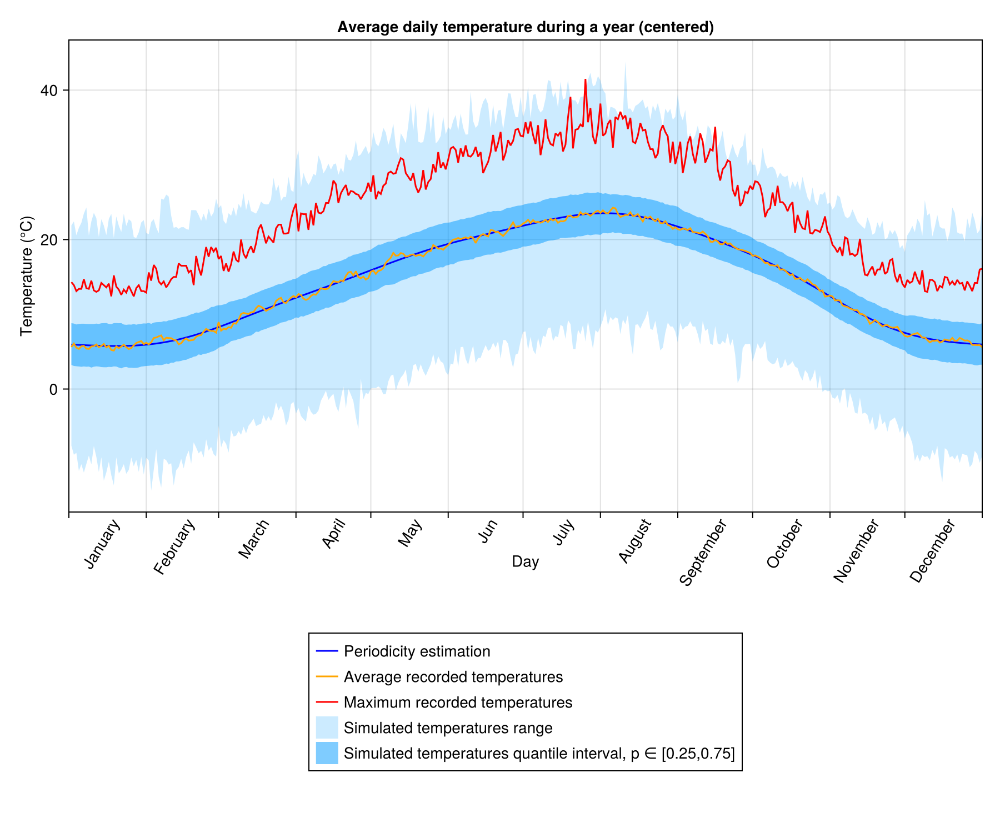

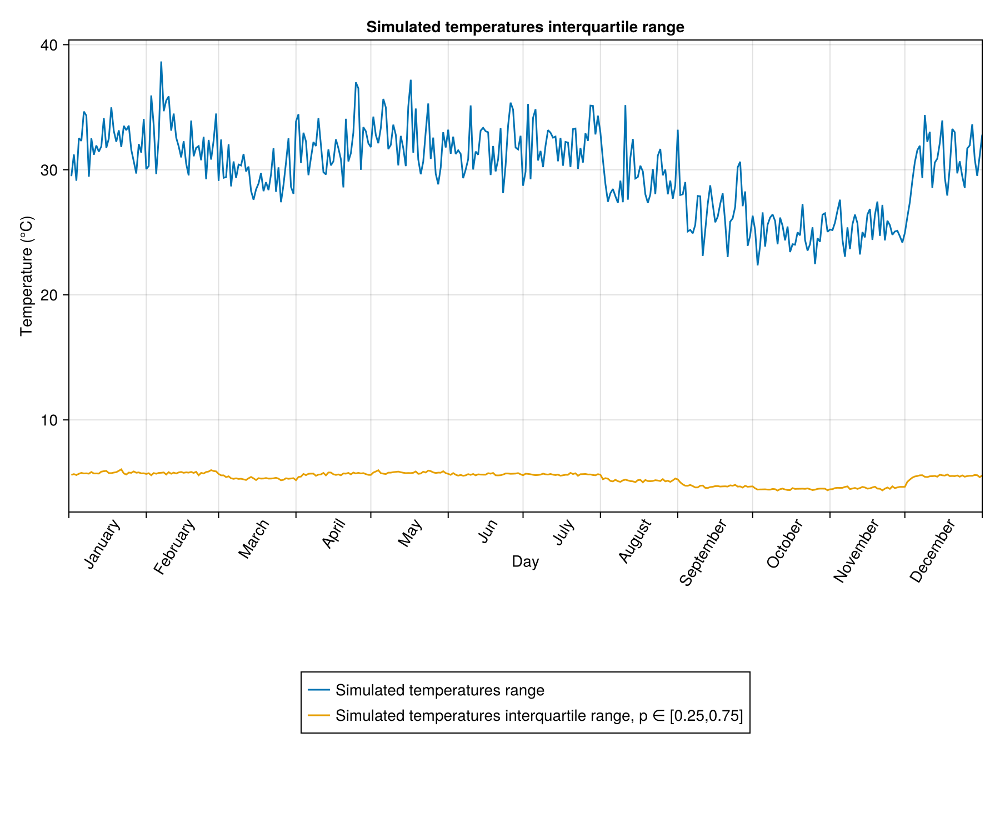

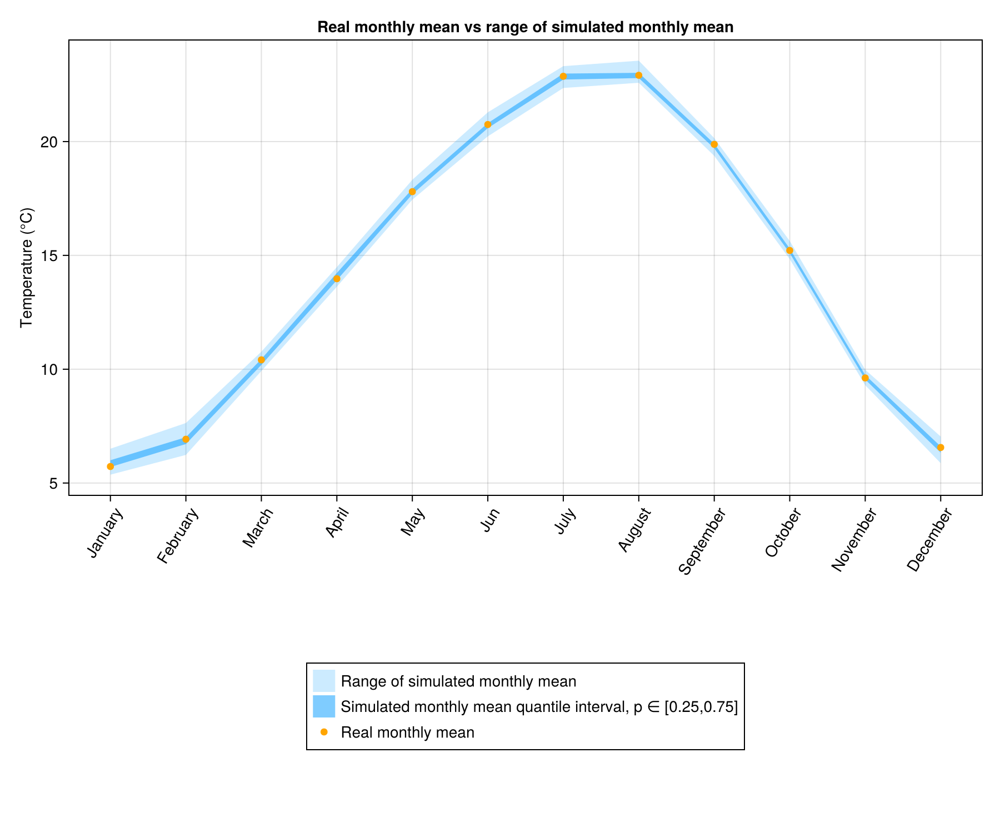

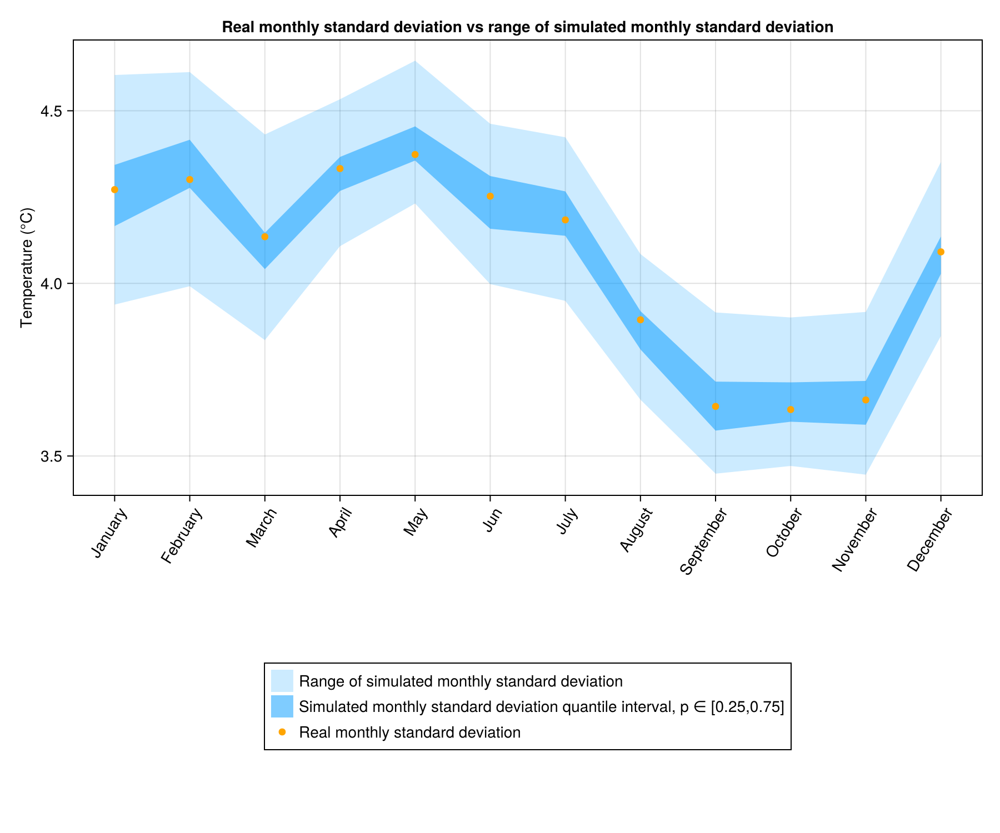

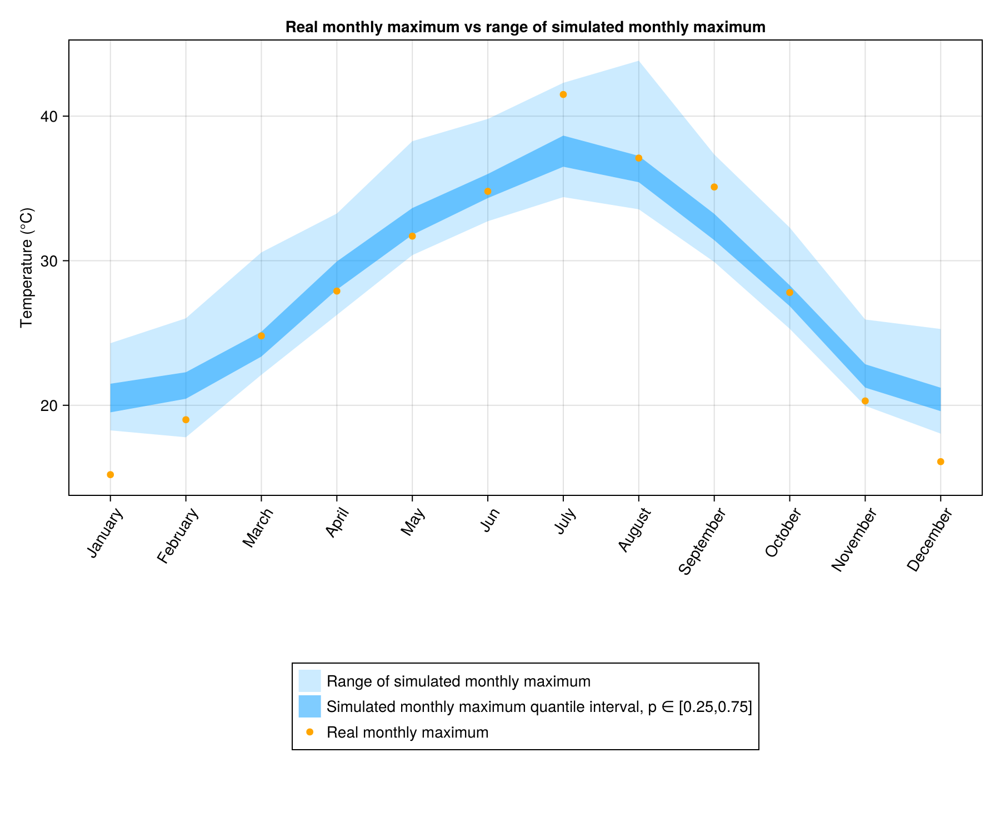

(CairoMakie.Screen{CairoMakie.IMAGE}(Scene (900px, 750px):
  0 Plots
  2 Child Scenes:
    ├ Scene (900px, 750px)
    └ Scene (900px, 750px), Cairo.CairoSurfaceImage{ColorTypes.ARGB32}(Ptr{Nothing} @0x000001e5beaa1390, 1800.0, 1500.0, ColorTypes.ARGB32[ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); … ; ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8)]), Cairo.CairoContext(Ptr{Nothing} @0x000001

In [10]:
Φ_month_mean,σ_month_mean=TakeParameters(Params,"concat")
sample_ = SimulateScenarios(Monthly_temp[1][1][1],series.DATE[1]:series.DATE[end],Φ_month_mean,σ_month_mean,period,n=100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end]) 
display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
display(PlotYearCurves([period,avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered)",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
"Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))

### With sum of likelihoods

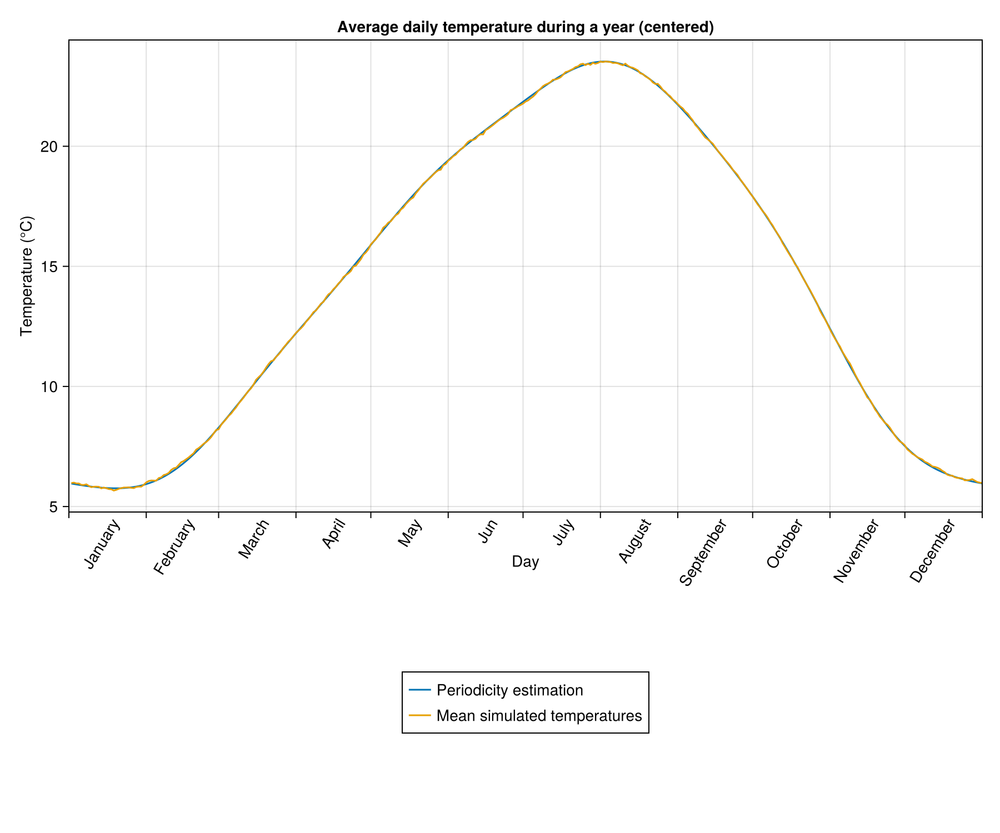

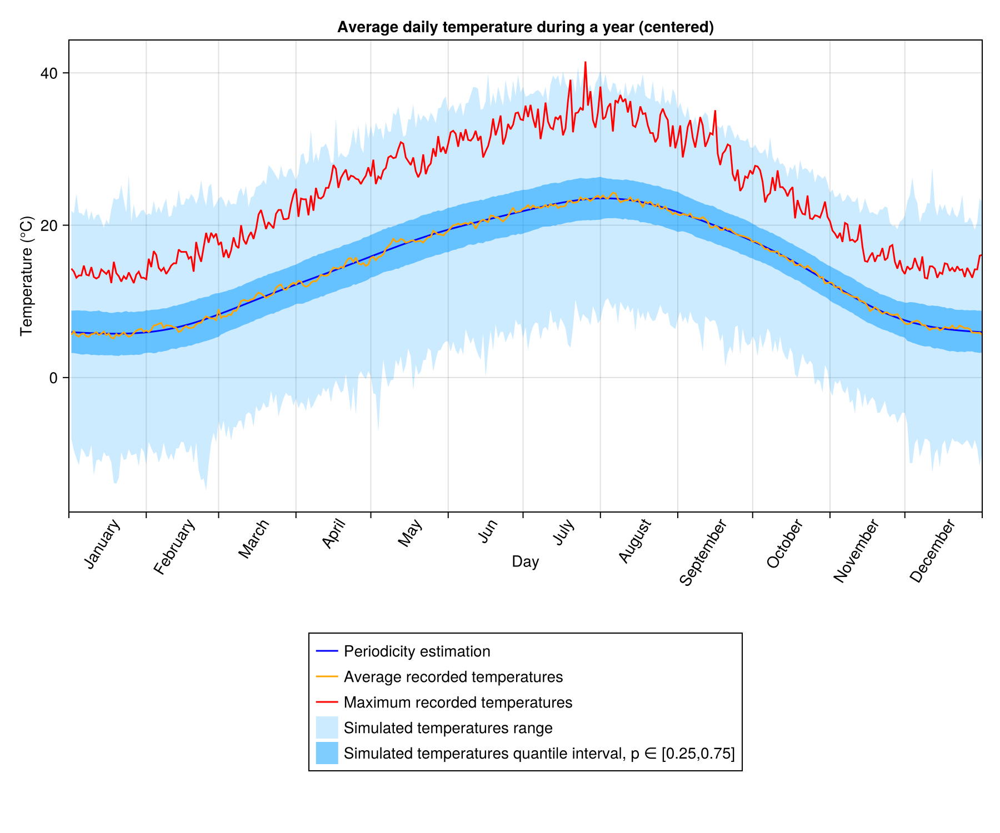

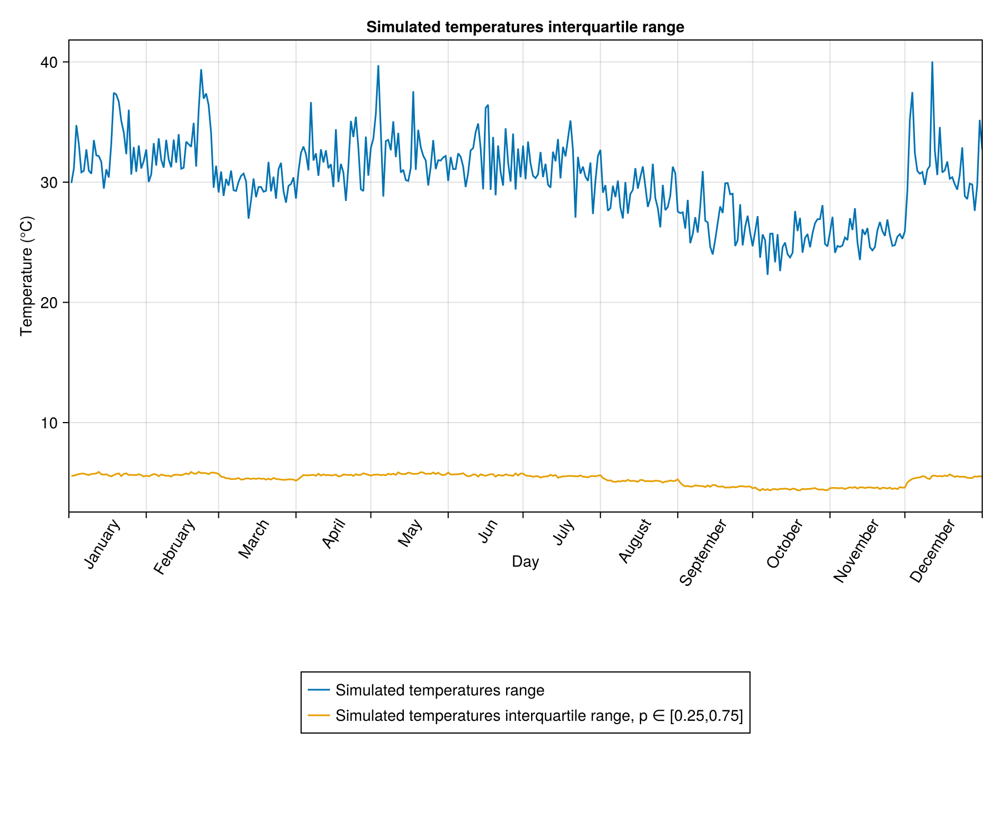

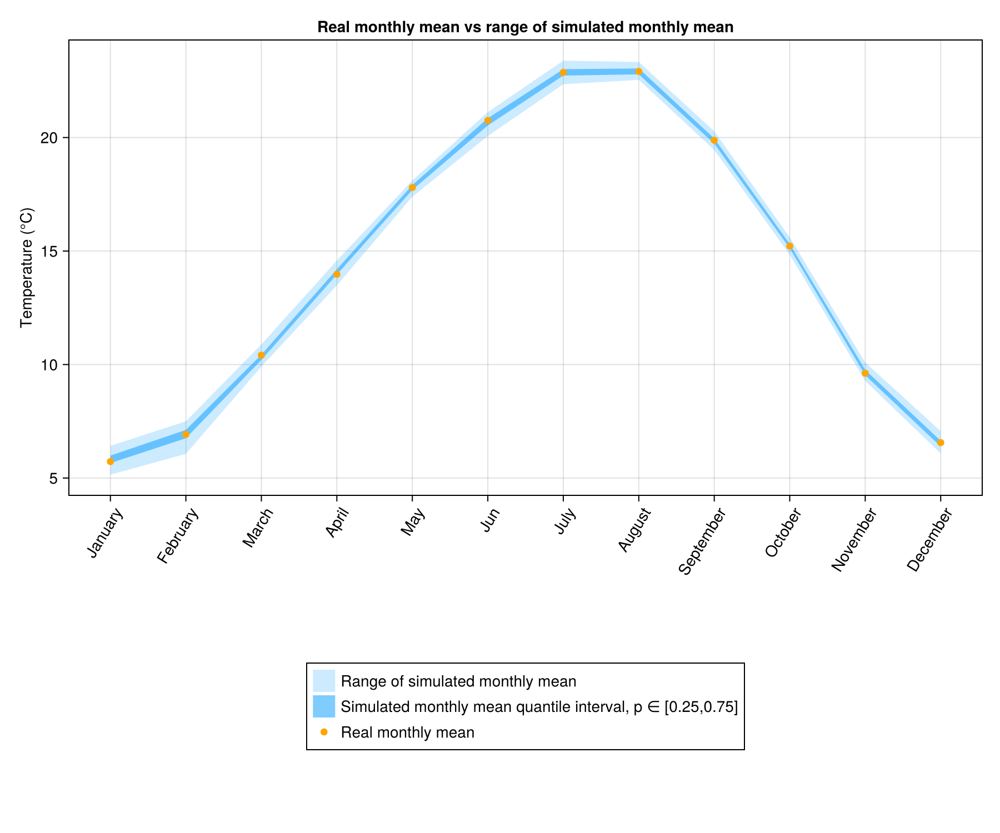

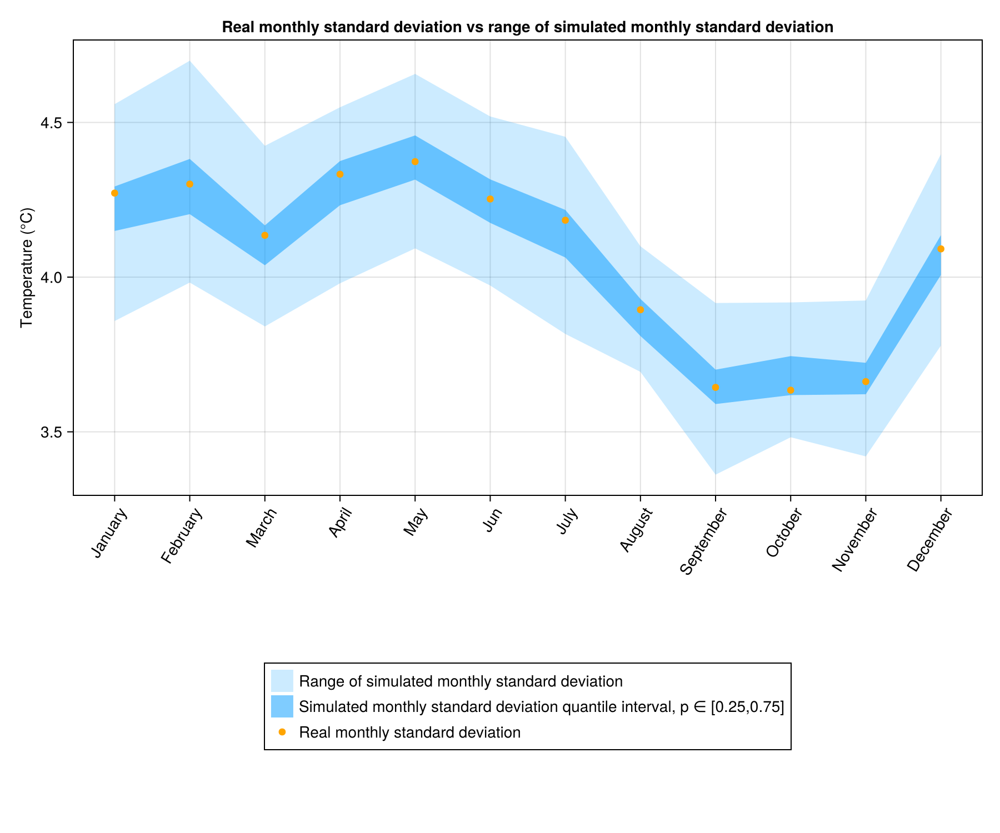

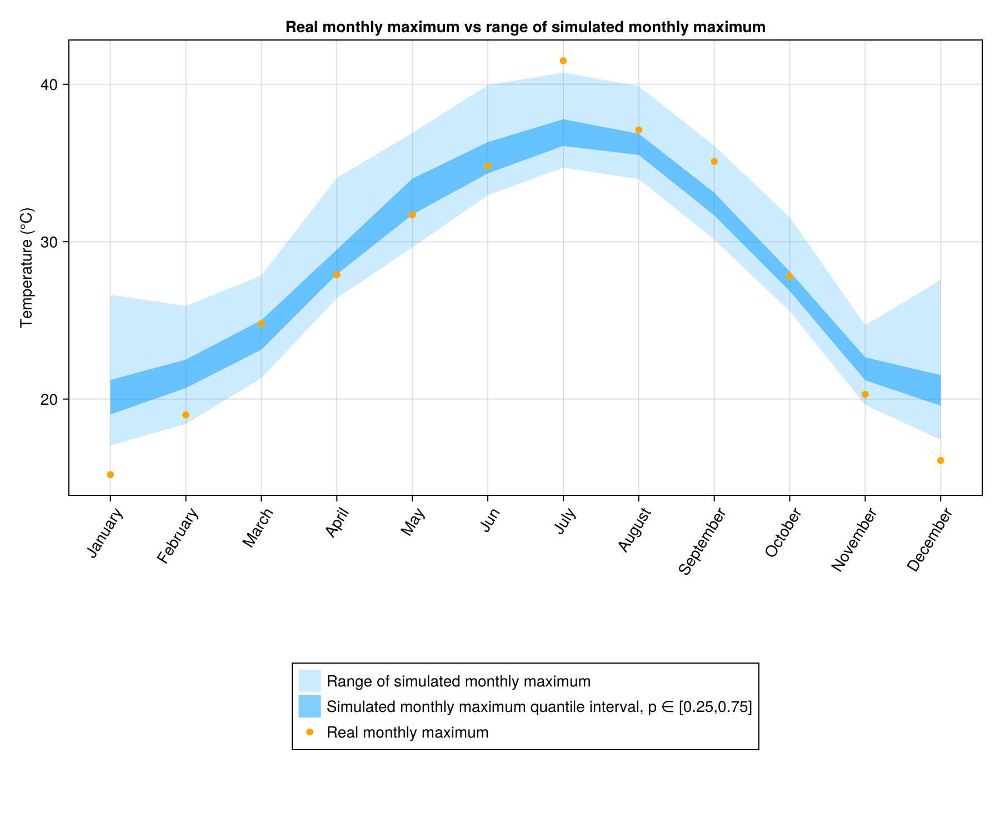

(CairoMakie.Screen{CairoMakie.IMAGE}(Scene (900px, 750px):
  0 Plots
  2 Child Scenes:
    ├ Scene (900px, 750px)
    └ Scene (900px, 750px), Cairo.CairoSurfaceImage{ColorTypes.ARGB32}(Ptr{Nothing} @0x000001e50dfc9f90, 1800.0, 1500.0, ColorTypes.ARGB32[ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); … ; ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8)]), Cairo.CairoContext(Ptr{Nothing} @0x000001

In [11]:
Φ_month_mean,σ_month_mean=TakeParameters(Params,"sumLL")
sample_ = SimulateScenarios(Monthly_temp[1][1][1],series.DATE[1]:series.DATE[end],Φ_month_mean,σ_month_mean,period,n=100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
display(PlotYearCurves([period,avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered)",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
"Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))

# Estimation AR(2)

## Estimation

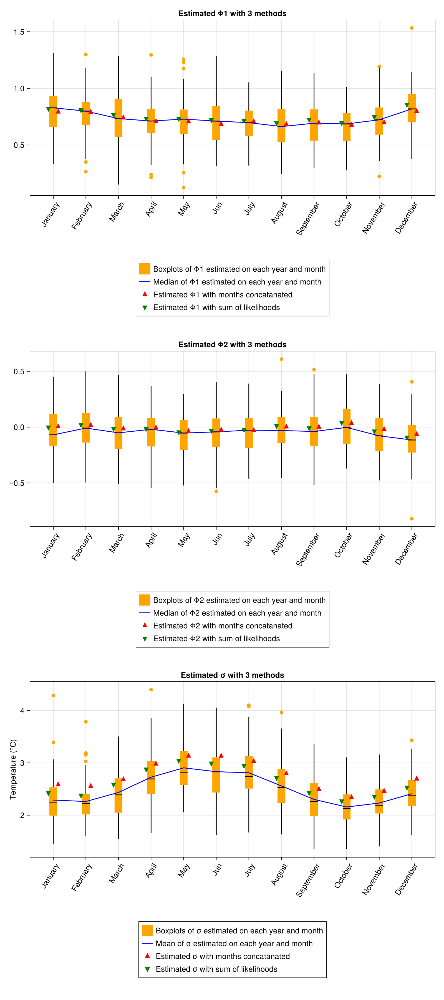

CairoMakie.Screen{IMAGE}


In [12]:
include("../utils/Estimation.jl")
Params, figure= AllEstimation(Monthly_temp, 2, lineplot=true)
display(figure)

In [13]:
Params[3][3]

12-element Vector{AbstractFloat}:
 2.426453822670391
 2.3809793472911758
 2.5884069312560305
 2.878215993829996
 3.0452578934784205
 2.9930454467063687
 2.9479697243545266
 2.7154810941053333
 2.429254574709389
 2.269414116758519
 2.3584290092007603
 2.531258047423358

### Estimation and simulation with sum of likelihoods

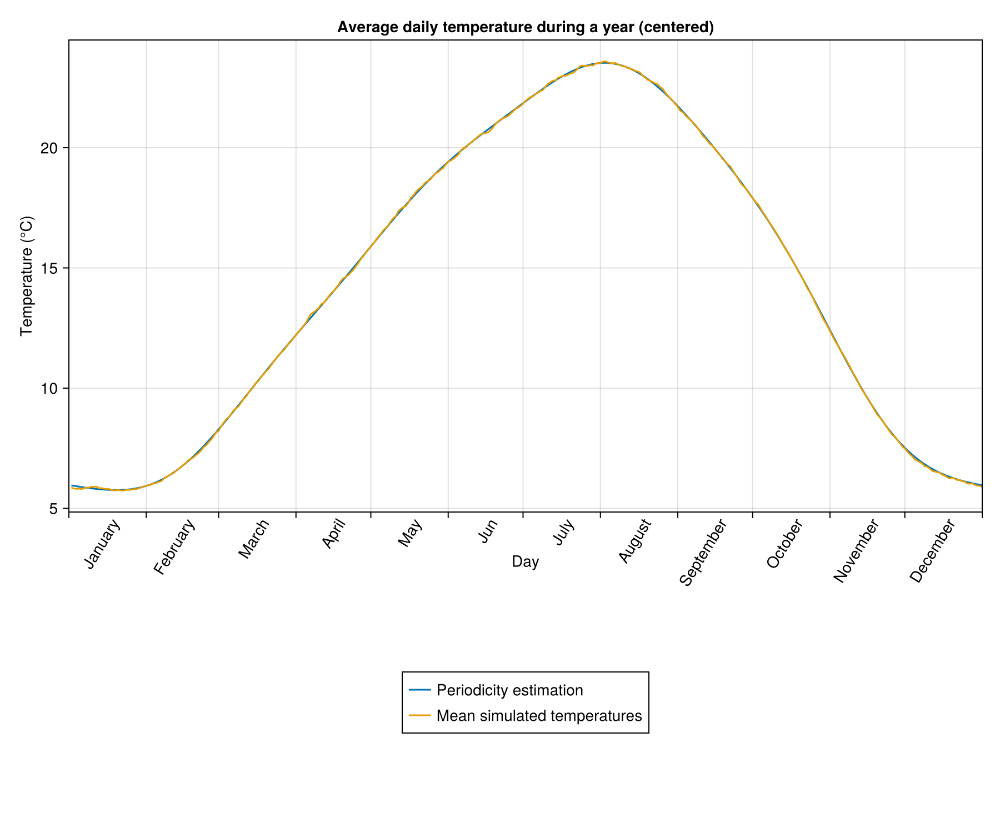

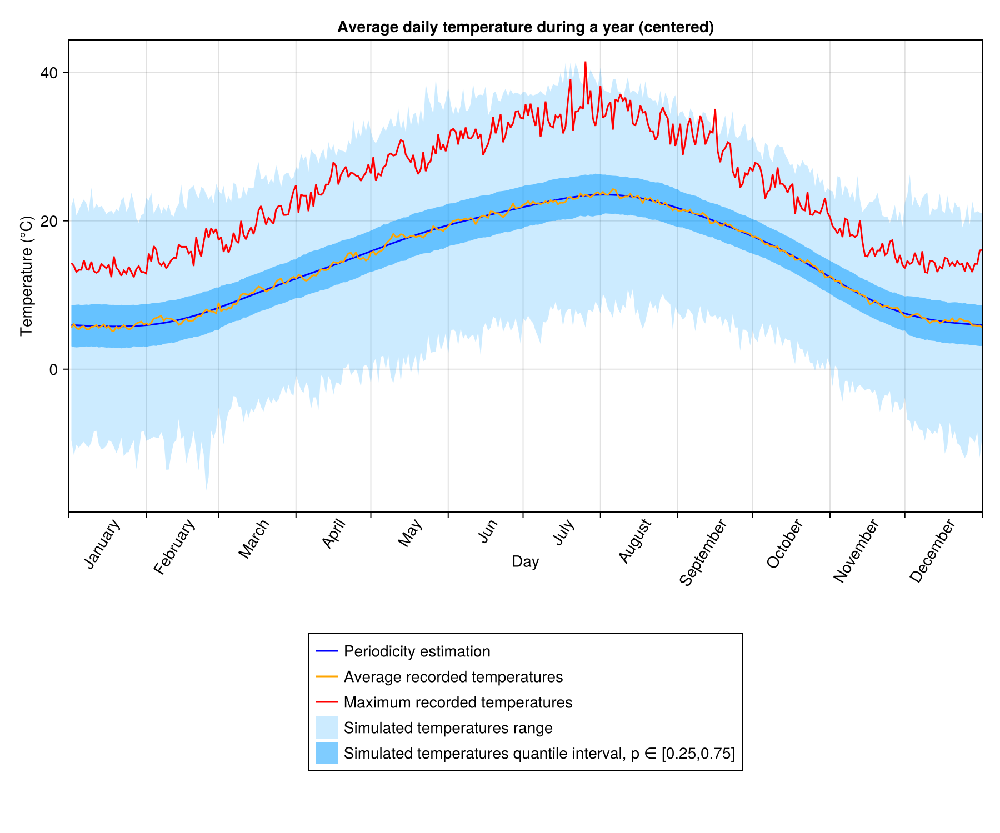

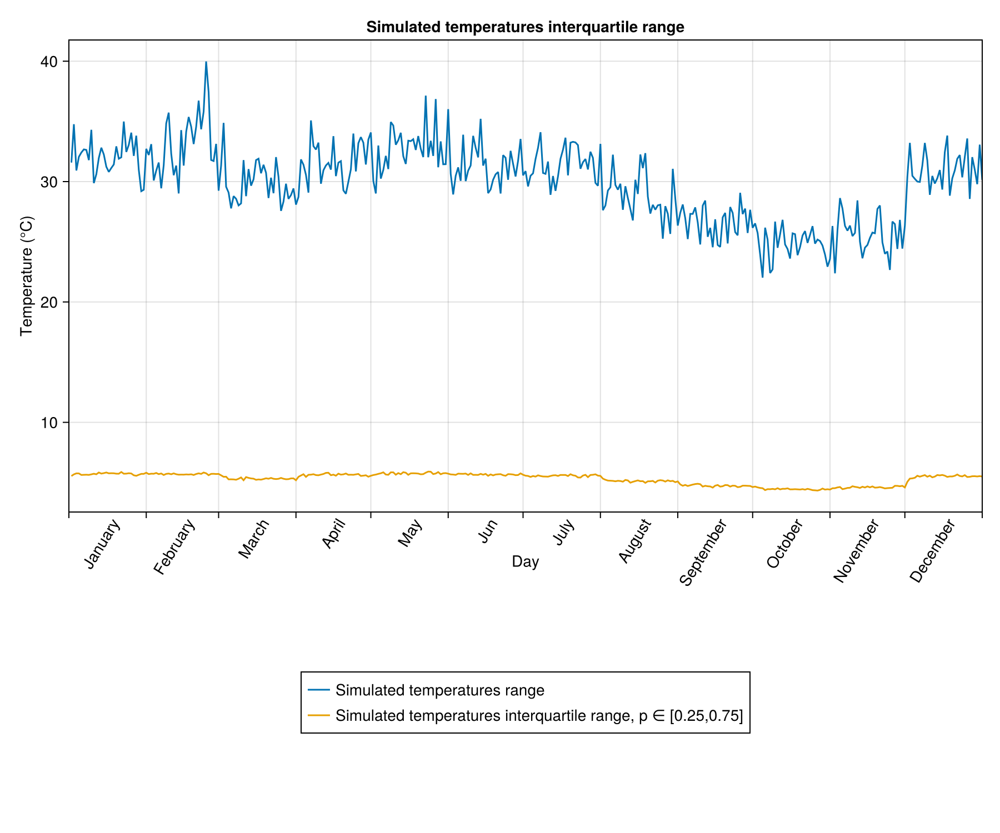

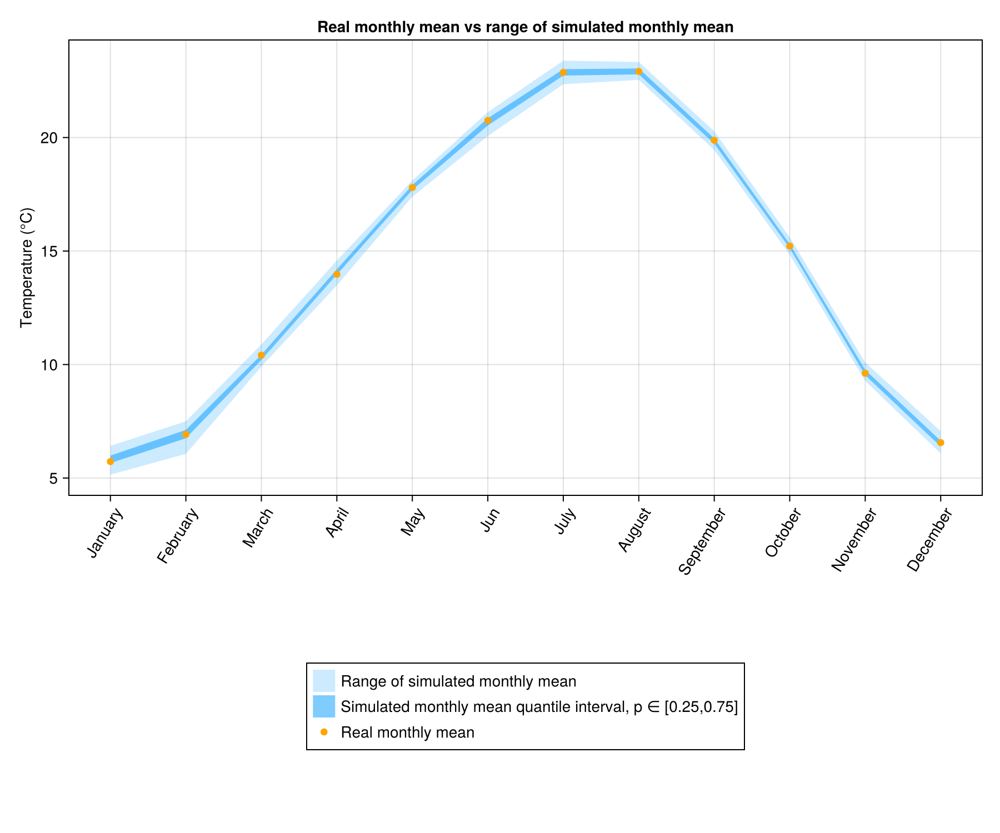

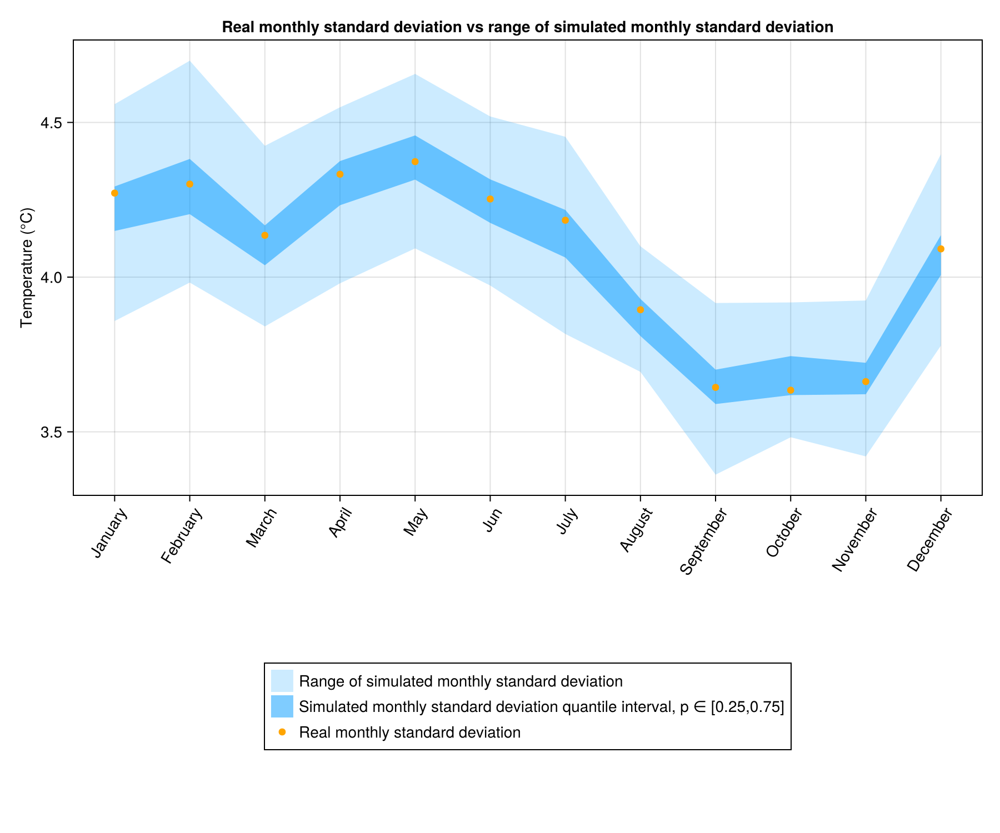

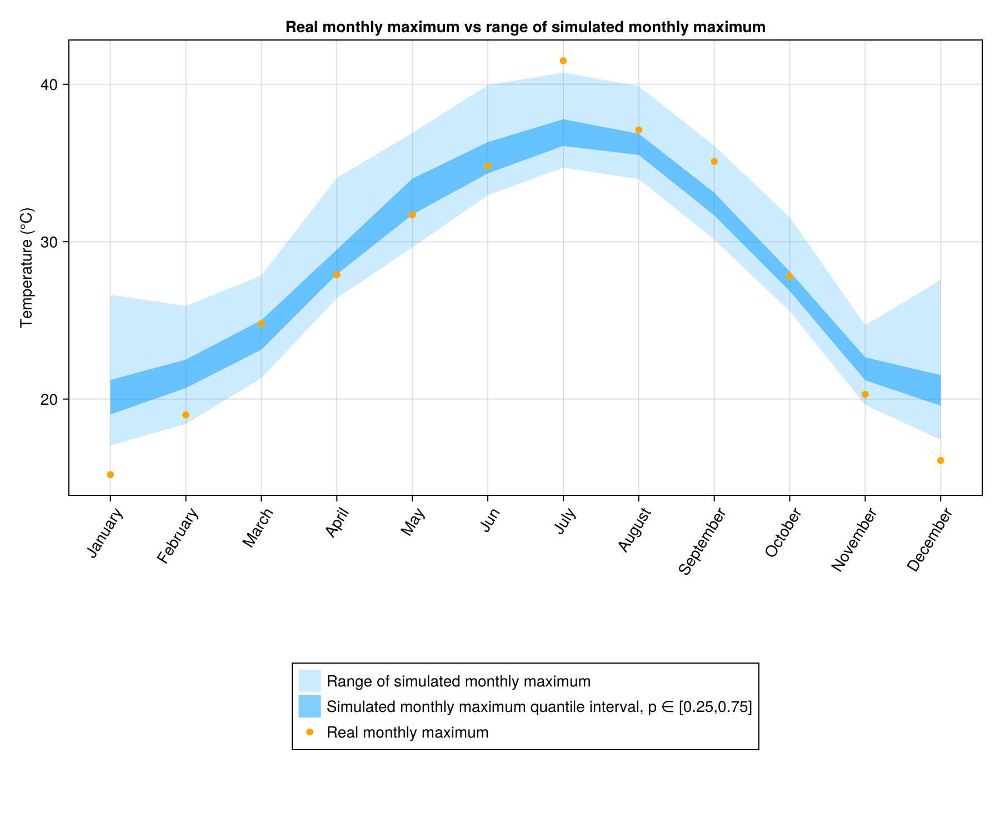

(CairoMakie.Screen{CairoMakie.IMAGE}(Scene (900px, 750px):
  0 Plots
  2 Child Scenes:
    ├ Scene (900px, 750px)
    └ Scene (900px, 750px), Cairo.CairoSurfaceImage{ColorTypes.ARGB32}(Ptr{Nothing} @0x000001e5703322e0, 1800.0, 1500.0, ColorTypes.ARGB32[ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); … ; ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8)]), Cairo.CairoContext(Ptr{Nothing} @0x000001

In [14]:
Φ_month_mean,σ_month_mean=TakeParameters(Params,"sumLL")
year_sample = GatherYearScenarios(SimulateScenarios(Monthly_temp[1][1][1:2],series.DATE[1]:series.DATE[end],Φ_month_mean,σ_month_mean,period,n=100),series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
display(PlotYearCurves([period,avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered)",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
"Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))